C:\Users\a10289\AppData\Local\Temp\ipykernel_34240\1577073294.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['sahm_recession'] = df_filtered['sahm_recession'].astype(int)
C:\Users\a10289\AppData\Local\Temp\ipykernel_34240\1577073294.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['nber_recession'] = df_filtered['nber_recession'].astype(int)
C:\Users\a10289\AppData\Local\Temp\ipykernel_34240\1577073294.py:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of

                                          Rule of Thumb  F1ScoreMetric  \
short term MM unemployment (ST MM U)           3.000000       1.000000   
Number of previous ST MM U                    12.000000       3.000000   
threshold                                      0.500000       0.400000   
MSE (%)                                        0.169061       0.064410   
Accuracy (%)                                  83.093923      93.558952   
Precision (%)                                 42.660550      76.000000   
Recall (%)                                    76.859504      76.612903   
F1 Score (%)                                  54.867257      76.305221   
MatthewsCorrelationCoefficientMetric (%)      48.481139      72.578974   
AUC (%)                                       80.457813      86.412512   

                                          MeanSquaredErrorMetric  \
short term MM unemployment (ST MM U)                    1.000000   
Number of previous ST MM U                       

C:\Users\a10289\AppData\Local\Temp\ipykernel_34240\1577073294.py:273: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.50' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  results_df.loc["threshold"] = results_df.loc["threshold"].apply(lambda x: f"{x:.2f}")
C:\Users\a10289\AppData\Local\Temp\ipykernel_34240\1577073294.py:273: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.40' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  results_df.loc["threshold"] = results_df.loc["threshold"].apply(lambda x: f"{x:.2f}")
C:\Users\a10289\AppData\Local\Temp\ipykernel_34240\1577073294.py:273: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.50' has dtype incompatible with flo

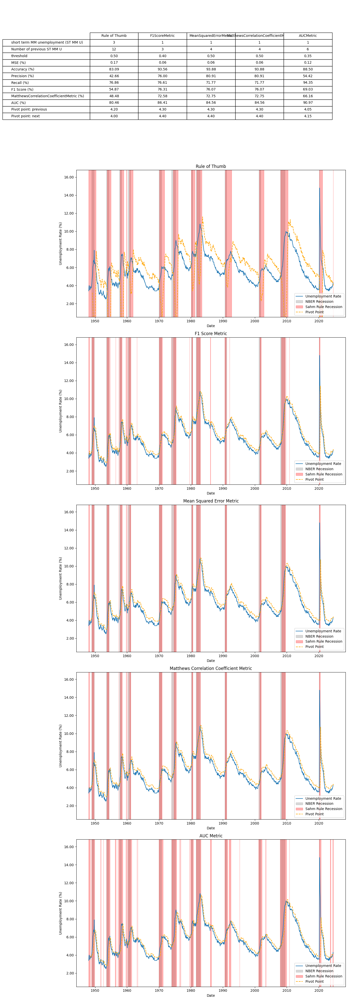

In [1]:
import os
import pandas as pd
import numpy as np
from pandas.plotting import table
import matplotlib.pyplot as plt
from fredapi import Fred
from itertools import product
from sklearn.metrics import confusion_matrix, precision_score, recall_score, f1_score, mean_squared_error, accuracy_score, matthews_corrcoef, roc_auc_score
import xlsxwriter

def get_file_path(filename, subdirectory='Data_eco_sentiment\\'):
    current_path = os.getcwd()
    return os.path.join(current_path, subdirectory, filename)

def download_and_merge_data(fred_api_key):
    fred = Fred(api_key=fred_api_key)
    unemployment_df = fred.get_series('UNRATE').to_frame(name='unemployment_rate')
    unemployment_df.index.name = 'DATE'
    unemployment_df.reset_index(inplace=True)
    
    nber_df = fred.get_series('USREC').to_frame(name='nber_recession')
    nber_df.index.name = 'DATE'
    nber_df.reset_index(inplace=True)

    unemployment_df['DATE'] = pd.to_datetime(unemployment_df['DATE'])
    nber_df['DATE'] = pd.to_datetime(nber_df['DATE'])
    nber_df['nber_recession'] = nber_df['nber_recession'].astype(bool)

    df = unemployment_df.merge(nber_df, on='DATE', how='left')
    df['nber_recession'] = df['nber_recession'].fillna(False).astype(int)
    return df

def calculate_sahm_rule(df, ct, lt, threshold=0.5):
    df['unemployment_rate_ma_ct'] = df['unemployment_rate'].rolling(window=ct).mean()
    df['unemployment_rate_ma_min_lt'] = df['unemployment_rate_ma_ct'].rolling(window=lt).min()
    df['sahm_rule_indicator'] = df['unemployment_rate_ma_ct'] - df['unemployment_rate_ma_min_lt'].shift(1)
    df['sahm_recession'] = np.nan
    df.loc[~df['sahm_rule_indicator'].isna(), 'sahm_recession'] = (df['sahm_rule_indicator'] > threshold).astype(int)
    return df

class PerformanceMetric:
    def calculate(self, df):
        df_filtered = df.dropna(subset=['sahm_recession', 'nber_recession'])
        df_filtered['sahm_recession'] = df_filtered['sahm_recession'].astype(int)
        df_filtered['nber_recession'] = df_filtered['nber_recession'].astype(int)
        return self.calculate_metric(df_filtered)
    
    def calculate_metric(self, df_filtered):
        raise NotImplementedError("Subclasses should implement this method!")

class MeanSquaredErrorMetric(PerformanceMetric):
    def calculate_metric(self, df_filtered):
        return mean_squared_error(df_filtered['nber_recession'], df_filtered['sahm_recession'])

class F1ScoreMetric(PerformanceMetric):
    def calculate_metric(self, df_filtered):
        tp = ((df_filtered['sahm_recession'] == 1) & (df_filtered['nber_recession'] == 1)).sum()
        fp = ((df_filtered['sahm_recession'] == 1) & (df_filtered['nber_recession'] == 0)).sum()
        fn = ((df_filtered['sahm_recession'] == 0) & (df_filtered['nber_recession'] == 1)).sum()
        tn = ((df_filtered['sahm_recession'] == 0) & (df_filtered['nber_recession'] == 0)).sum()
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0
        f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
        return f1_score

class MatthewsCorrelationCoefficientMetric(PerformanceMetric):
    def calculate_metric(self, df_filtered):
        return matthews_corrcoef(df_filtered['nber_recession'], df_filtered['sahm_recession'])

class AUCMetric(PerformanceMetric):
    def calculate_metric(self, df_filtered):
        return roc_auc_score(df_filtered['nber_recession'], df_filtered['sahm_recession'])

def grid_search(df, ct_values, lt_values, threshold_values, metric):
    best_params = None
    best_score = -float('inf') if isinstance(metric, (F1ScoreMetric, MatthewsCorrelationCoefficientMetric, AUCMetric)) else float('inf')
    
    for ct, lt, threshold in product(ct_values, lt_values, threshold_values):
        temp_df = calculate_sahm_rule(df.copy(), ct, lt, threshold)
        score = metric.calculate(temp_df)
        
        if isinstance(metric, (F1ScoreMetric, MatthewsCorrelationCoefficientMetric, AUCMetric)):
            if score > best_score:
                best_score = score
                best_params = (ct, lt, threshold)
        else:
            if score < best_score:
                best_score = score
                best_params = (ct, lt, threshold)
                
    return best_params, best_score

def find_optimal_parameters(df, ct_values, lt_values, threshold_values):
    rule_of_thumb_ct = 3
    rule_of_thumb_lt = 12
    rule_of_thumb_threshold = 0.5
    
    df_rule_of_thumb = calculate_sahm_rule(df.copy(), rule_of_thumb_ct, rule_of_thumb_lt, rule_of_thumb_threshold)
    df_filtered = df_rule_of_thumb.dropna(subset=['sahm_recession'])

    mse_rule_of_thumb = MeanSquaredErrorMetric().calculate(df_filtered)
    accuracy_rule_of_thumb = accuracy_score(df_filtered['nber_recession'], df_filtered['sahm_recession']) * 100
    precision_rule_of_thumb = precision_score(df_filtered['nber_recession'], df_filtered['sahm_recession']) * 100
    recall_rule_of_thumb = recall_score(df_filtered['nber_recession'], df_filtered['sahm_recession']) * 100
    f1_rule_of_thumb = F1ScoreMetric().calculate(df_filtered) * 100
    mcc_rule_of_thumb = MatthewsCorrelationCoefficientMetric().calculate(df_filtered) * 100
    auc_rule_of_thumb = AUCMetric().calculate(df_filtered) * 100

    f1_metric = F1ScoreMetric()
    f1_best_params, f1_best_score = grid_search(df, ct_values, lt_values, threshold_values, f1_metric)

    df_f1_best = calculate_sahm_rule(df.copy(), f1_best_params[0], f1_best_params[1], f1_best_params[2])
    df_filtered_f1_best = df_f1_best.dropna(subset=['sahm_recession'])

    mse_f1_best = MeanSquaredErrorMetric().calculate(df_filtered_f1_best)
    accuracy_f1_best = accuracy_score(df_filtered_f1_best['nber_recession'], df_filtered_f1_best['sahm_recession']) * 100
    precision_f1_best = precision_score(df_filtered_f1_best['nber_recession'], df_filtered_f1_best['sahm_recession']) * 100
    recall_f1_best = recall_score(df_filtered_f1_best['nber_recession'], df_filtered_f1_best['sahm_recession']) * 100
    f1_best_score *= 100
    mcc_f1_best = MatthewsCorrelationCoefficientMetric().calculate(df_filtered_f1_best) * 100
    auc_f1_best = AUCMetric().calculate(df_filtered_f1_best) * 100

    mse_metric = MeanSquaredErrorMetric()
    mse_best_params, mse_best_score = grid_search(df, ct_values, lt_values, threshold_values, mse_metric)

    df_mse_best = calculate_sahm_rule(df.copy(), mse_best_params[0], mse_best_params[1], mse_best_params[2])
    df_filtered_mse_best = df_mse_best.dropna(subset=['sahm_recession'])

    mse_mse_best = mse_best_score
    accuracy_mse_best = accuracy_score(df_filtered_mse_best['nber_recession'], df_filtered_mse_best['sahm_recession']) * 100
    precision_mse_best = precision_score(df_filtered_mse_best['nber_recession'], df_filtered_mse_best['sahm_recession']) * 100
    recall_mse_best = recall_score(df_filtered_mse_best['nber_recession'], df_filtered_mse_best['sahm_recession']) * 100
    f1_mse_best = F1ScoreMetric().calculate(df_filtered_mse_best) * 100
    mcc_mse_best = MatthewsCorrelationCoefficientMetric().calculate(df_filtered_mse_best) * 100
    auc_mse_best = AUCMetric().calculate(df_filtered_mse_best) * 100

    mcc_metric = MatthewsCorrelationCoefficientMetric()
    mcc_best_params, mcc_best_score = grid_search(df, ct_values, lt_values, threshold_values, mcc_metric)

    df_mcc_best = calculate_sahm_rule(df.copy(), mcc_best_params[0], mcc_best_params[1], mcc_best_params[2])
    df_filtered_mcc_best = df_mcc_best.dropna(subset=['sahm_recession'])

    mse_mcc_best = MeanSquaredErrorMetric().calculate(df_filtered_mcc_best)
    accuracy_mcc_best = accuracy_score(df_filtered_mcc_best['nber_recession'], df_filtered_mcc_best['sahm_recession']) * 100
    precision_mcc_best = precision_score(df_filtered_mcc_best['nber_recession'], df_filtered_mcc_best['sahm_recession']) * 100
    recall_mcc_best = recall_score(df_filtered_mcc_best['nber_recession'], df_filtered_mcc_best['sahm_recession']) * 100
    f1_mcc_best = F1ScoreMetric().calculate(df_filtered_mcc_best) * 100
    mcc_mcc_best = MatthewsCorrelationCoefficientMetric().calculate(df_filtered_mcc_best) * 100
    auc_mcc_best = AUCMetric().calculate(df_filtered_mcc_best) * 100

    # AUC metric grid search
    auc_metric = AUCMetric()
    auc_best_params, auc_best_score = grid_search(df, ct_values, lt_values, threshold_values, auc_metric)

    df_auc_best = calculate_sahm_rule(df.copy(), auc_best_params[0], auc_best_params[1], auc_best_params[2])
    df_filtered_auc_best = df_auc_best.dropna(subset=['sahm_recession'])

    mse_auc_best = MeanSquaredErrorMetric().calculate(df_filtered_auc_best)
    accuracy_auc_best = accuracy_score(df_filtered_auc_best['nber_recession'], df_filtered_auc_best['sahm_recession']) * 100
    precision_auc_best = precision_score(df_filtered_auc_best['nber_recession'], df_filtered_auc_best['sahm_recession']) * 100
    recall_auc_best = recall_score(df_filtered_auc_best['nber_recession'], df_filtered_auc_best['sahm_recession']) * 100
    f1_auc_best = F1ScoreMetric().calculate(df_filtered_auc_best) * 100
    mcc_auc_best = MatthewsCorrelationCoefficientMetric().calculate(df_filtered_auc_best) * 100
    auc_best_score *= 100

    # Create DataFrame for Results
    result_data = {
        "Rule of Thumb": [rule_of_thumb_ct,
                          rule_of_thumb_lt,
                          rule_of_thumb_threshold,
                          mse_rule_of_thumb,
                          accuracy_rule_of_thumb,
                          precision_rule_of_thumb,
                          recall_rule_of_thumb,
                          f1_rule_of_thumb,
                          mcc_rule_of_thumb,
                          auc_rule_of_thumb],
        
        "F1ScoreMetric": [f1_best_params[0],
                          f1_best_params[1],
                          f1_best_params[2],
                          mse_f1_best,
                          accuracy_f1_best,
                          precision_f1_best,
                          recall_f1_best,
                          f1_best_score,
                          mcc_f1_best,
                          auc_f1_best],
        
        "MeanSquaredErrorMetric": [mse_best_params[0],
                                   mse_best_params[1],
                                   mse_best_params[2],
                                   mse_mse_best,
                                   accuracy_mse_best,
                                   precision_mse_best,
                                   recall_mse_best,
                                   f1_mse_best,
                                   mcc_mse_best,
                                   auc_mse_best],

        "MatthewsCorrelationCoefficientMetric": [mcc_best_params[0],
                                                 mcc_best_params[1],
                                                 mcc_best_params[2],
                                                 mse_mcc_best,
                                                 accuracy_mcc_best,
                                                 precision_mcc_best,
                                                 recall_mcc_best,
                                                 f1_mcc_best,
                                                 mcc_mcc_best,
                                                 auc_mcc_best],
        "AUCMetric": [auc_best_params[0],
                      auc_best_params[1],
                      auc_best_params[2],
                      mse_auc_best,
                      accuracy_auc_best,
                      precision_auc_best,
                      recall_auc_best,
                      f1_auc_best,
                      mcc_auc_best,
                      auc_best_score]
    }

    results_df = pd.DataFrame(result_data, index=[
        "short term MM unemployment (ST MM U)",
        "Number of previous ST MM U",
        "threshold",
        "MSE (%)",
        "Accuracy (%)",
        "Precision (%)",
        "Recall (%)",
        "F1 Score (%)",
        "MatthewsCorrelationCoefficientMetric (%)",
        "AUC (%)"
    ])

    print(results_df)
    return results_df, auc_best_params

def calculate_pivot_points_v2(df, ct, lt, threshold):
    df['unemployment_rate_ma_ct'] = df['unemployment_rate'].rolling(window=ct).mean()
    df['unemployment_rate_ma_min_lt'] = df['unemployment_rate_ma_ct'].rolling(window=lt).min()
    df['shifted_unemployment_rate_ma_min_lt'] = df['unemployment_rate_ma_min_lt'].shift(1)
    
    future_row = pd.DataFrame({
        'DATE': [df['DATE'].max() + pd.DateOffset(months=1)],
        'unemployment_rate': [None] 
    })
    df = pd.concat([df, future_row], ignore_index=True)

    df['pivot_point_calculated'] = df['shifted_unemployment_rate_ma_min_lt'] * ct + threshold * ct
    
    for i in range(1, ct):
        df['pivot_point_calculated'] -= df['unemployment_rate'].shift(i)
    
    if pd.isna(df.iloc[-1]['pivot_point_calculated']):
        df.iloc[-1, df.columns.get_loc('pivot_point_calculated')] = (
            df.iloc[-2]['unemployment_rate_ma_min_lt'] * ct + threshold * ct - 
            sum(df.iloc[-(i+2)]['unemployment_rate'] for i in range(ct - 1))
        )

    return df[['DATE', 'unemployment_rate', 'pivot_point_calculated']]

import matplotlib.pyplot as plt
from pandas.plotting import table

def display_full_report(df, results_df, df_rule_of_thumb, df_f1_best, df_mse_best, df_mcc_best, df_auc_best, 
                        ct_f1_best, lt_f1_best, threshold_f1_best, 
                        ct_mse_best, lt_mse_best, threshold_mse_best,
                        ct_mcc_best, lt_mcc_best, threshold_mcc_best,
                        ct_auc_best, lt_auc_best, threshold_auc_best):
    
    # Format the threshold and measures with percentages to 2 decimal places
    results_df.loc["threshold"] = results_df.loc["threshold"].apply(lambda x: f"{x:.2f}")
    results_df.loc["MSE (%)"] = results_df.loc["MSE (%)"].apply(lambda x: f"{x:.2f}")
    results_df.loc["Accuracy (%)"] = results_df.loc["Accuracy (%)"].apply(lambda x: f"{x:.2f}")
    results_df.loc["Precision (%)"] = results_df.loc["Precision (%)"].apply(lambda x: f"{x:.2f}")
    results_df.loc["Recall (%)"] = results_df.loc["Recall (%)"].apply(lambda x: f"{x:.2f}")
    results_df.loc["F1 Score (%)"] = results_df.loc["F1 Score (%)"].apply(lambda x: f"{x:.2f}")
    results_df.loc["MatthewsCorrelationCoefficientMetric (%)"] = results_df.loc["MatthewsCorrelationCoefficientMetric (%)"].apply(lambda x: f"{x:.2f}")
    results_df.loc["AUC (%)"] = results_df.loc["AUC (%)"].apply(lambda x: f"{x:.2f}")

    # Ensure the "short term MM unemployment (ST MM U)" and "Number of previous ST MM U" are integers
    results_df.loc["short term MM unemployment (ST MM U)"] = results_df.loc["short term MM unemployment (ST MM U)"].astype(int)
    results_df.loc["Number of previous ST MM U"] = results_df.loc["Number of previous ST MM U"].astype(int)
    
    # Calculate the pivot points for each method and format them to 2 decimal places
    pivot_df_rule_of_thumb = calculate_pivot_points_v2(df_rule_of_thumb.copy(), 3, 12, 0.5)
    pivot_df_f1_best = calculate_pivot_points_v2(df_f1_best.copy(), ct_f1_best, lt_f1_best, threshold_f1_best)
    pivot_df_mse_best = calculate_pivot_points_v2(df_mse_best.copy(), ct_mse_best, lt_mse_best, threshold_mse_best)
    pivot_df_mcc_best = calculate_pivot_points_v2(df_mcc_best.copy(), ct_mcc_best, lt_mcc_best, threshold_mcc_best)
    pivot_df_auc_best = calculate_pivot_points_v2(df_auc_best.copy(), ct_auc_best, lt_auc_best, threshold_auc_best)

    results_df.loc['Pivot point: previous'] = [
        f"{pivot_df_rule_of_thumb['pivot_point_calculated'].iloc[-2]:.2f}",
        f"{pivot_df_f1_best['pivot_point_calculated'].iloc[-2]:.2f}",
        f"{pivot_df_mse_best['pivot_point_calculated'].iloc[-2]:.2f}",
        f"{pivot_df_mcc_best['pivot_point_calculated'].iloc[-2]:.2f}",
        f"{pivot_df_auc_best['pivot_point_calculated'].iloc[-2]:.2f}"
    ]
    results_df.loc['Pivot point: next'] = [
        f"{pivot_df_rule_of_thumb['pivot_point_calculated'].iloc[-1]:.2f}",
        f"{pivot_df_f1_best['pivot_point_calculated'].iloc[-1]:.2f}",
        f"{pivot_df_mse_best['pivot_point_calculated'].iloc[-1]:.2f}",
        f"{pivot_df_mcc_best['pivot_point_calculated'].iloc[-1]:.2f}",
        f"{pivot_df_auc_best['pivot_point_calculated'].iloc[-1]:.2f}"
    ]

    # Create the figure and axes
    fig, axes = plt.subplots(6, 1, figsize=(14, 40))  # Adjust to add space for the table and AUC graph

    # Add the table
    axes[0].axis('off')  # Hide the first axis for the table
    tab = table(axes[0], results_df, loc='center', cellLoc='center', colWidths=[0.15]*len(results_df.columns))
    tab.auto_set_font_size(False)
    tab.set_fontsize(10)
    tab.scale(1.2, 1.2)

    # Helper function to format y-axis labels to 2 decimal places
    def format_yaxis(ax):
        ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.2f}'))

    # Plot Rule of Thumb Graph
    axes[1].plot(df_rule_of_thumb['DATE'], df_rule_of_thumb['unemployment_rate'], label='Unemployment Rate')
    ymin, ymax = round(df_rule_of_thumb['unemployment_rate'].min() - 2, 2), round(df_rule_of_thumb['unemployment_rate'].max() + 2, 2)
    axes[1].fill_between(df_rule_of_thumb['DATE'], ymin, ymax, where=df_rule_of_thumb['nber_recession'], color='gray', alpha=0.3, label='NBER Recession')
    axes[1].fill_between(df_rule_of_thumb['DATE'], ymin, ymax, where=df_rule_of_thumb['sahm_recession'], color='red', alpha=0.3, label='Sahm Rule Recession')
    axes[1].plot(pivot_df_rule_of_thumb['DATE'], pivot_df_rule_of_thumb['pivot_point_calculated'], color='orange', linestyle='--', label='Pivot Point')
    axes[1].set_title('Rule of Thumb')
    axes[1].set_xlabel('Date')
    axes[1].set_ylabel('Unemployment Rate (%)')
    axes[1].legend()
    axes[1].set_ylim(ymin, ymax)
    format_yaxis(axes[1])

    # Plot F1 Score Graph
    axes[2].plot(df_f1_best['DATE'], df_f1_best['unemployment_rate'], label='Unemployment Rate')
    ymin, ymax = round(df_f1_best['unemployment_rate'].min() - 2, 2), round(df_f1_best['unemployment_rate'].max() + 2, 2)
    axes[2].fill_between(df_f1_best['DATE'], ymin, ymax, where=df_f1_best['nber_recession'], color='gray', alpha=0.3, label='NBER Recession')
    axes[2].fill_between(df_f1_best['DATE'], ymin, ymax, where=df_f1_best['sahm_recession'], color='red', alpha=0.3, label='Sahm Rule Recession')
    axes[2].plot(pivot_df_f1_best['DATE'], pivot_df_f1_best['pivot_point_calculated'], color='orange', linestyle='--', label='Pivot Point')
    axes[2].set_title('F1 Score Metric')
    axes[2].set_xlabel('Date')
    axes[2].set_ylabel('Unemployment Rate (%)')
    axes[2].legend()
    axes[2].set_ylim(ymin, ymax)
    format_yaxis(axes[2])

    # Plot Mean Squared Error Graph
    axes[3].plot(df_mse_best['DATE'], df_mse_best['unemployment_rate'], label='Unemployment Rate')
    ymin, ymax = round(df_mse_best['unemployment_rate'].min() - 2, 2), round(df_mse_best['unemployment_rate'].max() + 2, 2)
    axes[3].fill_between(df_mse_best['DATE'], ymin, ymax, where=df_mse_best['nber_recession'], color='gray', alpha=0.3, label='NBER Recession')
    axes[3].fill_between(df_mse_best['DATE'], ymin, ymax, where=df_mse_best['sahm_recession'], color='red', alpha=0.3, label='Sahm Rule Recession')
    axes[3].plot(pivot_df_mse_best['DATE'], pivot_df_mse_best['pivot_point_calculated'], color='orange', linestyle='--', label='Pivot Point')
    axes[3].set_title('Mean Squared Error Metric')
    axes[3].set_xlabel('Date')
    axes[3].set_ylabel('Unemployment Rate (%)')
    axes[3].legend()
    axes[3].set_ylim(ymin, ymax)
    format_yaxis(axes[3])

    # Plot Matthews Correlation Coefficient Graph
    axes[4].plot(df_mcc_best['DATE'], df_mcc_best['unemployment_rate'], label='Unemployment Rate')
    ymin, ymax = round(df_mcc_best['unemployment_rate'].min() - 2, 2), round(df_mcc_best['unemployment_rate'].max() + 2, 2)
    axes[4].fill_between(df_mcc_best['DATE'], ymin, ymax, where=df_mcc_best['nber_recession'], color='gray', alpha=0.3, label='NBER Recession')
    axes[4].fill_between(df_mcc_best['DATE'], ymin, ymax, where=df_mcc_best['sahm_recession'], color='red', alpha=0.3, label='Sahm Rule Recession')
    axes[4].plot(pivot_df_mcc_best['DATE'], pivot_df_mcc_best['pivot_point_calculated'], color='orange', linestyle='--', label='Pivot Point')
    axes[4].set_title('Matthews Correlation Coefficient Metric')
    axes[4].set_xlabel('Date')
    axes[4].set_ylabel('Unemployment Rate (%)')
    axes[4].legend()
    axes[4].set_ylim(ymin, ymax)
    format_yaxis(axes[4])

    # Plot AUC Graph
    axes[5].plot(df_auc_best['DATE'], df_auc_best['unemployment_rate'], label='Unemployment Rate')
    ymin, ymax = round(df_auc_best['unemployment_rate'].min() - 2, 2), round(df_auc_best['unemployment_rate'].max() + 2, 2)
    axes[5].fill_between(df_auc_best['DATE'], ymin, ymax, where=df_auc_best['nber_recession'], color='gray', alpha=0.3, label='NBER Recession')
    axes[5].fill_between(df_auc_best['DATE'], ymin, ymax, where=df_auc_best['sahm_recession'], color='red', alpha=0.3, label='Sahm Rule Recession')
    axes[5].plot(pivot_df_auc_best['DATE'], pivot_df_auc_best['pivot_point_calculated'], color='orange', linestyle='--', label='Pivot Point')
    axes[5].set_title('AUC Metric')
    axes[5].set_xlabel('Date')
    axes[5].set_ylabel('Unemployment Rate (%)')
    axes[5].legend()
    axes[5].set_ylim(ymin, ymax)
    format_yaxis(axes[5])

    plt.tight_layout()
    plt.show()

# if you want to save the f1 metrics
def save_f1score_matrix(df, ct_values, lt_values, threshold=0.5, filename="f1score_matrix.xlsx"):
    # Create a workbook and add a worksheet
    workbook = xlsxwriter.Workbook(filename)
    worksheet = workbook.add_worksheet()

    # Write the header for lt_values
    worksheet.write(0, 0, "CT \\ LT")
    for i, lt in enumerate(lt_values):
        worksheet.write(0, i + 1, lt)

    # Fill the matrix with F1 scores
    for i, ct in enumerate(ct_values):
        worksheet.write(i + 1, 0, ct)  # Write the ct values in the first column
        for j, lt in enumerate(lt_values):
            # Calculate the Sahm rule with the given ct, lt, and threshold
            temp_df = calculate_sahm_rule(df.copy(), ct, lt, threshold)
            # Calculate the F1 score
            f1_score_value = F1ScoreMetric().calculate(temp_df)
            # Write the F1 score to the corresponding cell
            worksheet.write(i + 1, j + 1, f1_score_value)

    # Close the workbook to save the file
    workbook.close()



def main():
    df0 = download_and_merge_data('yout FRED key')
     # Your FRED API key (free on the FED website)
    # Go on the fed FRED API sign-up page , Fed will provide you a key
    
    # https://fredhelp.stlouisfed.org/
    # https://fredhelp.stlouisfed.org/fred/account/fred-account-features/register/
    # https://fred.stlouisfed.org/docs/api/fred/
    # https://fredaccount.stlouisfed.org/apikey
    # https://fred.stlouisfed.org/docs/api/fred/

    threshold_values = np.array([0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5, 0.55, 0.6, 0.65, 0.7])
    ct_values = range(1, 13)
    lt_values = range(2, 25)

    results_df, auc_best_params = find_optimal_parameters(df0, ct_values, lt_values, threshold_values)
    # results_df.to_excel(get_file_path('results_df.xlsx'), index=False)

    ct_f1_best = int(results_df.iloc[0, 1])
    lt_f1_best = int(results_df.iloc[1, 1])
    threshold_f1_best = float(results_df.iloc[2, 1])

    ct_mse_best = int(results_df.iloc[0, 2])
    lt_mse_best = int(results_df.iloc[1, 2])
    threshold_mse_best = float(results_df.iloc[2, 2])

    ct_mcc_best = int(results_df.iloc[0, 3])
    lt_mcc_best = int(results_df.iloc[1, 3])
    threshold_mcc_best = float(results_df.iloc[2, 3])

    ct_auc_best = int(auc_best_params[0])
    lt_auc_best = int(auc_best_params[1])
    threshold_auc_best = float(auc_best_params[2])

    df_rule_of_thumb = calculate_sahm_rule(df0.copy(), 3, 12, 0.5)
#   df_rule_of_thumb.to_excel(get_file_path('df_rule_of_thumb.xlsx'), index=False)

    df_f1_best = calculate_sahm_rule(df0.copy(), ct_f1_best, lt_f1_best, threshold_f1_best)
#   df_f1_best.to_excel(get_file_path('df_f1_best.xlsx'), index=False)

    df_mse_best = calculate_sahm_rule(df0.copy(), ct_mse_best, lt_mse_best, threshold_mse_best)
#  df_mse_best.to_excel(get_file_path('df_mse_best.xlsx'), index=False)

    df_mcc_best = calculate_sahm_rule(df0.copy(), ct_mcc_best, lt_mcc_best, threshold_mcc_best)
#   df_mcc_best.to_excel(get_file_path('df_mcc_best.xlsx'), index=False)

    df_auc_best = calculate_sahm_rule(df0.copy(), ct_auc_best, lt_auc_best, threshold_auc_best)
#   df_auc_best.to_excel(get_file_path('df_auc_best.xlsx'), index=False)

    display_full_report(df0, results_df, df_rule_of_thumb, df_f1_best, df_mse_best, df_mcc_best, df_auc_best,
                        ct_f1_best, lt_f1_best, threshold_f1_best,
                        ct_mse_best, lt_mse_best, threshold_mse_best,
                        ct_mcc_best, lt_mcc_best, threshold_mcc_best,
                        ct_auc_best, lt_auc_best, threshold_auc_best)

#   pivot_df_v2 = calculate_pivot_points_v2(df0, ct=3, lt=12, threshold=0.5)
#   print(pivot_df_v2.tail(20))
#  save_f1score_matrix(df0, ct_values, lt_values, threshold=0.4)


if __name__ == '__main__':
    main()
    
   

